In [1]:
import pandas as pd
import pickle
import glob
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText
from matplotlib.ticker import MaxNLocator
import seaborn as sns

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from pymbar import bar, exp
from transformato.constants import kB, temperature
from openmm import unit
from openmm.unit import kilocalorie_per_mole
kT = kB * temperature

from rdkit import Chem
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
from rdkit.Chem.Draw.MolDrawing import DrawingOptions
from PIL import Image
import io
from matplotlib import colors
import seaborn as sns

import scipy
from scipy.signal import savgol_filter

from sklearn.metrics import mean_absolute_error, mean_squared_error

from transformato.constants import kB, temperature

kT = kB * temperature

Warning on use of the timeseries module: If the inherent timescales of the system are long compared to those being analyzed, this statistical inefficiency may be an underestimate.  The estimate presumes the use of many statistically independent samples.  Tests should be performed to assess whether this condition is satisfied.   Be cautious in the interpretation of the data.
/scratch/data/johannes/miniconda3/envs/openmmml-nnpops/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data = pd.read_csv(
    "https://raw.githubusercontent.com/JohannesKarwou/notebooks/main/data/freeSolvCGenFF.csv"
)

data.loc[:, "dG (corrected)"] = np.nan
data.loc[:, "Ml correction"] = np.nan
data.loc[:, "error"] = np.nan

In [3]:
data = data.sort_values(by="diff", ascending=False)
data = data[0:100]

In [4]:
# set up color palette
palett = sns.color_palette(n_colors=8)
palett_as_hex = palett.as_hex()

c1, c2, c3, c4, c5, c7 = (
    palett_as_hex[0],
    palett_as_hex[1],
    palett_as_hex[2],
    palett_as_hex[3],
    palett_as_hex[4],
    palett_as_hex[6],
)
c8 = matplotlib.colors.to_rgba("k", alpha=0.1)
c8_2 = matplotlib.colors.to_rgba("k", alpha=0.01)
# c5 = lila
# c7= rosa

In [5]:
all_files = glob.glob("output/*")

files = []
for file in all_files:
    files.append(file.split("/")[-1].split(".")[0])

In [6]:
rgb_blue = colors.to_rgb(c1)  # Nitrogen
rgb_green = colors.to_rgb(c3)  # Chlorine
rgb_red = colors.to_rgb(c4)  # Oxygen
rgb_orange = colors.to_rgb(c2)  # Sulfur
rgb_purble = colors.to_rgb(c5)  # Flour

In [7]:
def create_image(smi):
    mol = Chem.MolFromSmiles(smi)
    rdDepictor.Compute2DCoords(mol)
    # create a drawer container
    drawer = rdMolDraw2D.MolDraw2DCairo(100, 100)
    # define drawer options
    ud = {7: rgb_blue, 8: rgb_red, 9: rgb_purble, 16: rgb_orange, 17: rgb_green}
    drawer.drawOptions().updateAtomPalette(ud)
    # drawer.drawOptions().setBackgroundColour((0,0,0))
    drawer.drawOptions().clearBackground
    drawer.DrawMolecule(mol)
    drawer.FinishDrawing()

    bio = io.BytesIO(drawer.GetDrawingText())
    img = Image.open(bio)

    return img


def make_png_transparent(img):
    # taken from here:
    # https://stackoverflow.com/questions/765736/how-to-use-pil-to-make-all-white-pixels-transparent

    img = img.convert("RGBA")
    datas = img.getdata()

    newData = []
    for item in datas:
        if item[0] == 255 and item[1] == 255 and item[2] == 255:
            newData.append((255, 255, 255, 0))
        else:
            newData.append(item)

    img.putdata(newData)

    return img

In [8]:
def calculate_corrections(results, dG):
    waterbox = bar(
        results["waterbox"].W_reference_to_target,
        results["waterbox"].W_target_to_reference,
    )
    vacuum = bar(
        results["vacuum"].W_reference_to_target, results["vacuum"].W_target_to_reference
    )

    correction = ((-vacuum["Delta_f"] + waterbox["Delta_f"]) * kT).value_in_unit(
        unit.kilocalorie_per_mole
    )
    error = (
        np.sqrt(vacuum["dDelta_f"] ** 2 + waterbox["dDelta_f"] ** 2) * kT
    ).value_in_unit(unit.kilocalorie_per_mole)

    mlCorrected = (
        (-vacuum["Delta_f"] * kT).value_in_unit(unit.kilocalorie_per_mole)
        + dG
        + (waterbox["Delta_f"] * kT).value_in_unit(unit.kilocalorie_per_mole)
    )

    return correction, error, mlCorrected, waterbox, vacuum

In [9]:
with open(f"output/mobley_6917738.pickle", "rb") as file:
    results = pickle.load(file)
    correction, error, mlCorrected, _, _ = calculate_corrections(results, 3)

print(
    "Waterbox:",
    bar(
        results["waterbox"].W_reference_to_target,
        results["waterbox"].W_target_to_reference,
    ),
)

print(
    "Vacuum:",
    bar(
        results["vacuum"].W_reference_to_target, results["vacuum"].W_target_to_reference
    ),
)

Waterbox: {'Delta_f': -260039.3850067712, 'dDelta_f': 0.10885409559063809}
Vacuum: {'Delta_f': -260037.14829056343, 'dDelta_f': 0.11924305965582878}


In [10]:
def histogram_intersection(h1, h2, bins):
    bins = np.diff(bins)
    sm = 0
    for i in range(len(bins)):
        sm += min(bins[i]*h1[i], bins[i]*h2[i])
    return sm

In [11]:
def calculate_overlap(results,env):

    # Calculate the histograms with the same binning
    bin_edges = np.histogram_bin_edges(
        results[env].W_reference_to_target, bins="auto"
    )
    hist_ref, _ = np.histogram(results[env].W_reference_to_target, bins=bin_edges)
    hist_rev, _ = np.histogram(-results[env].W_target_to_reference, bins=bin_edges)

    # Calculate the overlap
    overlap = np.minimum(hist_ref, hist_rev)

    # Calculate the percentage overlap
    percentage_overlap = (np.sum(overlap) / np.sum(hist_ref)) * 100

    return percentage_overlap

In [12]:
def create_artist(fig):
    r1 = matplotlib.patches.Rectangle(
        xy=(0.25, 0.001),
        width=0.25,
        height=0.999,
        transform=fig.transFigure,
        fc=c8,
        zorder=-1,
    )

    r2 = matplotlib.patches.Rectangle(
        xy=(0.749, 0.001),
        width=0.25,
        height=0.999,
        transform=fig.transFigure,
        fc=c8,
        zorder=-1,
    )

    return r1, r2


def add_headerText():
    at = AnchoredText(
        f"vacuum",
        prop={"fontsize": 25, "fontweight": "bold"},
        frameon=True,
        loc="center",
        bbox_to_anchor=(0.5, 1.15),
        bbox_transform=axs[1].transAxes,
    )
    # at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
    axs[1].add_artist(at)

    at = AnchoredText(
        f"vacuum",
        prop={"fontsize": 25, "fontweight": "bold"},
        frameon=True,
        loc="center",
        bbox_to_anchor=(0.5, 1.15),
        bbox_transform=axs[3].transAxes,
    )
    # at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
    axs[3].add_artist(at)

    at = AnchoredText(
        f"aqueous solution",
        prop={"fontsize": 25, "fontweight": "bold"},
        frameon=False,
        loc="center",
        bbox_to_anchor=(0.5, 1.15),
        bbox_transform=axs[0].transAxes,
    )
    axs[0].add_artist(at)

    at = AnchoredText(
        f"aqueous solution",
        prop={"fontsize": 25, "fontweight": "bold"},
        frameon=False,
        loc="center",
        bbox_to_anchor=(0.5, 1.15),
        bbox_transform=axs[2].transAxes,
    )
    axs[2].add_artist(at)

In [13]:
def plot_one_subplot(
    name, results, env, corrected, i, dG, experiment, correction, error
):
    average = ((bar(
        results[env].W_reference_to_target,
        results[env].W_target_to_reference,
    )["Delta_f"])*kT).value_in_unit(kilocalorie_per_mole)

    sns.histplot(
        ax=axs[i],
        data=(results[env].W_reference_to_target*kT).value_in_unit(kilocalorie_per_mole) - average,
        kde=True,
        color=c1,
        alpha=0.4,
        bins=50,
        lw=0,
        stat="density",
        label=r"MM $\rightarrow$ ML/MM",
        zorder=20,
        line_kws={"alpha": 1, "lw": 1.5},
    )
 
    sns.histplot(
        ax=axs[i],
        data=-(results[env].W_target_to_reference*kT).value_in_unit(kilocalorie_per_mole) - average,
        kde=True,
        color=c3,
        alpha=0.4,
        bins=50,
        lw=0,
        stat="density",
        label=r"ML/MM $\rightarrow$ MM",
        zorder=20,
        line_kws={"alpha": 1, "lw": 1.5},
    )

    axs[i].set(ylabel="")

    if env == "waterbox":
        img = create_image(smi)
        img = make_png_transparent(img)

        inset_ax = inset_axes(axs[i], loc="upper right", height=1, width=1)
        inset_ax.imshow(img, interpolation="spline16")
        inset_ax.axis("off")

        at = AnchoredText(
            f"$\Delta$$G_{{corrected}}$ : {round(correction,2)}$\pm${round(error,2)}\n$\Delta$G (TF): {dG}\nexp: {experiment}\noverlap: {int(calculate_overlap(results,env))}%",
            prop={"fontsize": 12},
            frameon=True,
            loc=2,
        )
        at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
        axs[i].add_artist(at)
        axs[i].set_title(f"{name}", loc="right", fontsize=18)
        
    elif env == "vacuum":
        at = AnchoredText(
            f"overlap: {int(calculate_overlap(results,env))}%",
            prop={"fontsize": 12},
            frameon=False,
            loc=2,
        )
        axs[i].add_artist(at)   
        axs[i].set_facecolor(c8_2)

    axs[i].ticklabel_format(useOffset=False)

    #############################################################
    #### Create twinaxis for showing the standard deviation #####
    #############################################################
    ax2 = axs[i].twinx()
    cum_stddev_from_mm_to_ml = savgol_filter(
        [
            results[env].W_reference_to_target[:x].std()
            for x in range(1, len(results[env].W_reference_to_target) + 1)
        ],
        51,
        7,
    )

    cum_stddev_from_ml_to_mm = savgol_filter(
        [
            results[env].W_target_to_reference[:x].std()
            for x in range(1, len(results[env].W_target_to_reference) + 1)
        ],
        51,
        7,
    )
    ax2.plot(
        np.linspace(
            axs[i].get_xlim()[0],
            axs[i].get_xlim()[1],
            num=len(cum_stddev_from_mm_to_ml),
        ),
        cum_stddev_from_mm_to_ml,
        color=c1,
        linewidth=2,
        linestyle="--",
        alpha=0.7,
        label=r"std dev W (MM $\rightarrow$ ML/MM)",
    )
    ax2.plot(
        np.linspace(
            axs[i].get_xlim()[0],
            axs[i].get_xlim()[1],
            num=len(cum_stddev_from_mm_to_ml),
        ),
        cum_stddev_from_ml_to_mm,
        color=c3,
        linewidth=2,
        linestyle="--",
        alpha=0.7,
        label=r"std dev W (ML/MM $\rightarrow$ MM)",
    )
    ax2.set_yticks([0, 1, 2, 3, 4])


/tmp/ipykernel_65251/1743128015.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


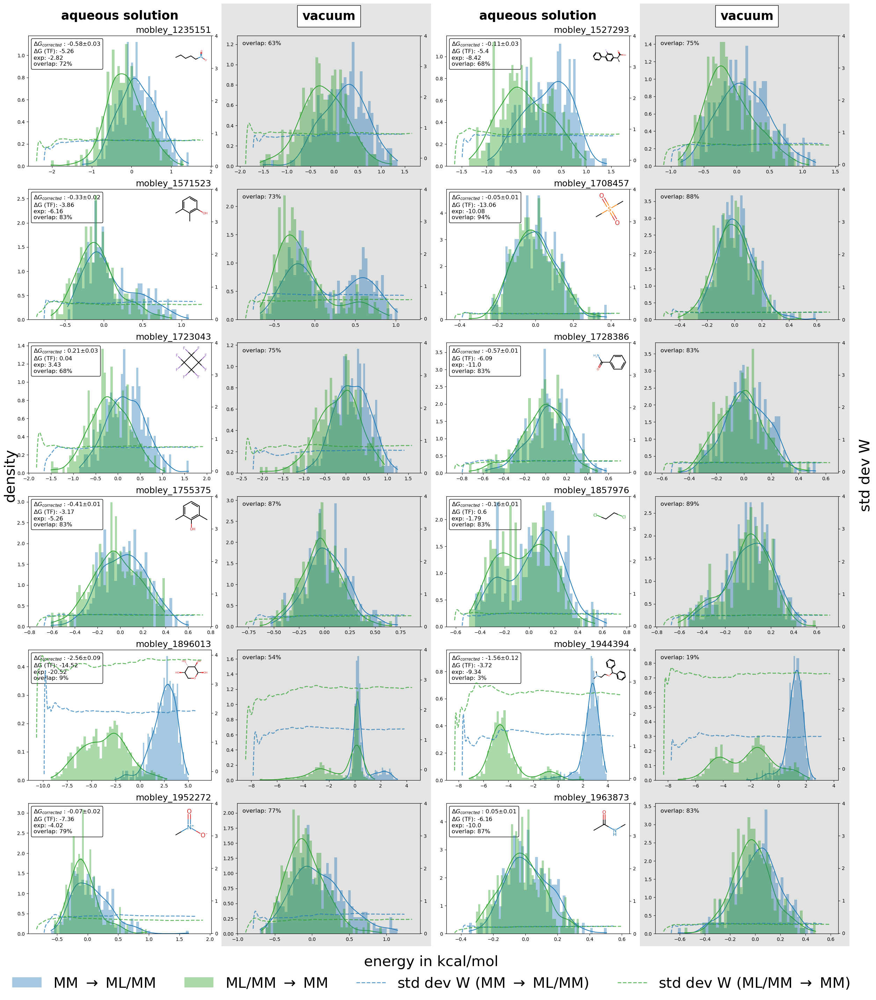

/tmp/ipykernel_65251/1743128015.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


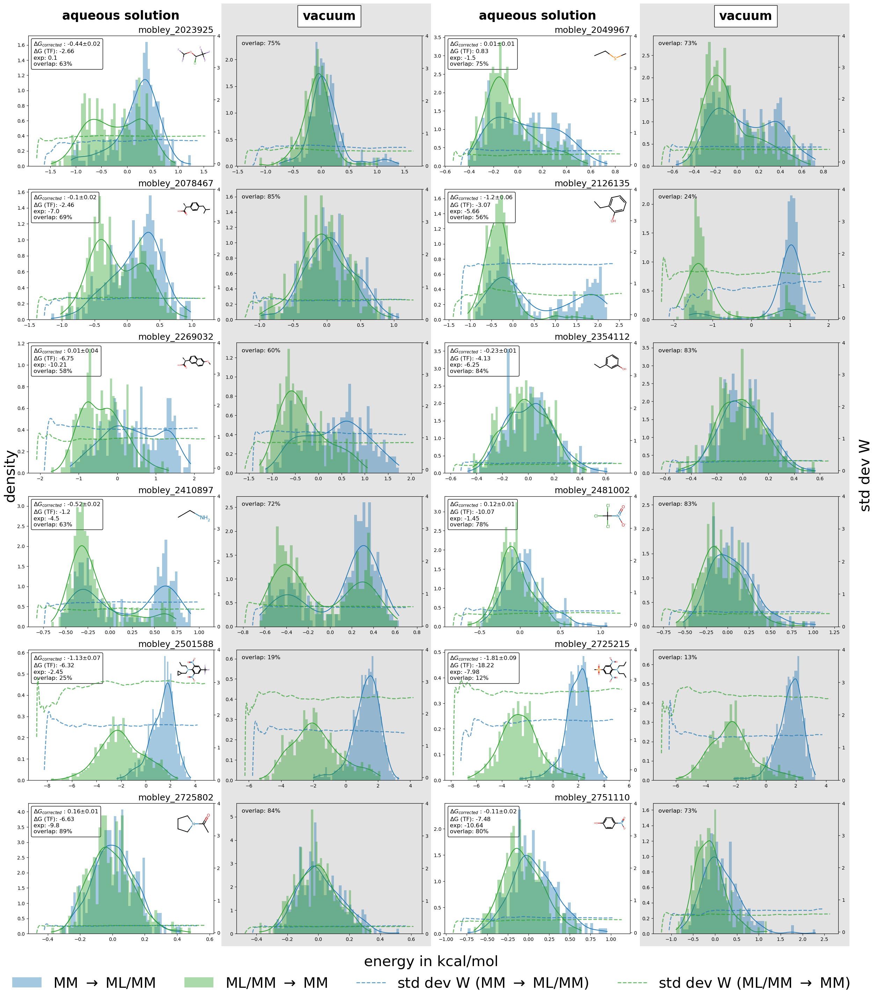

/tmp/ipykernel_65251/1743128015.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


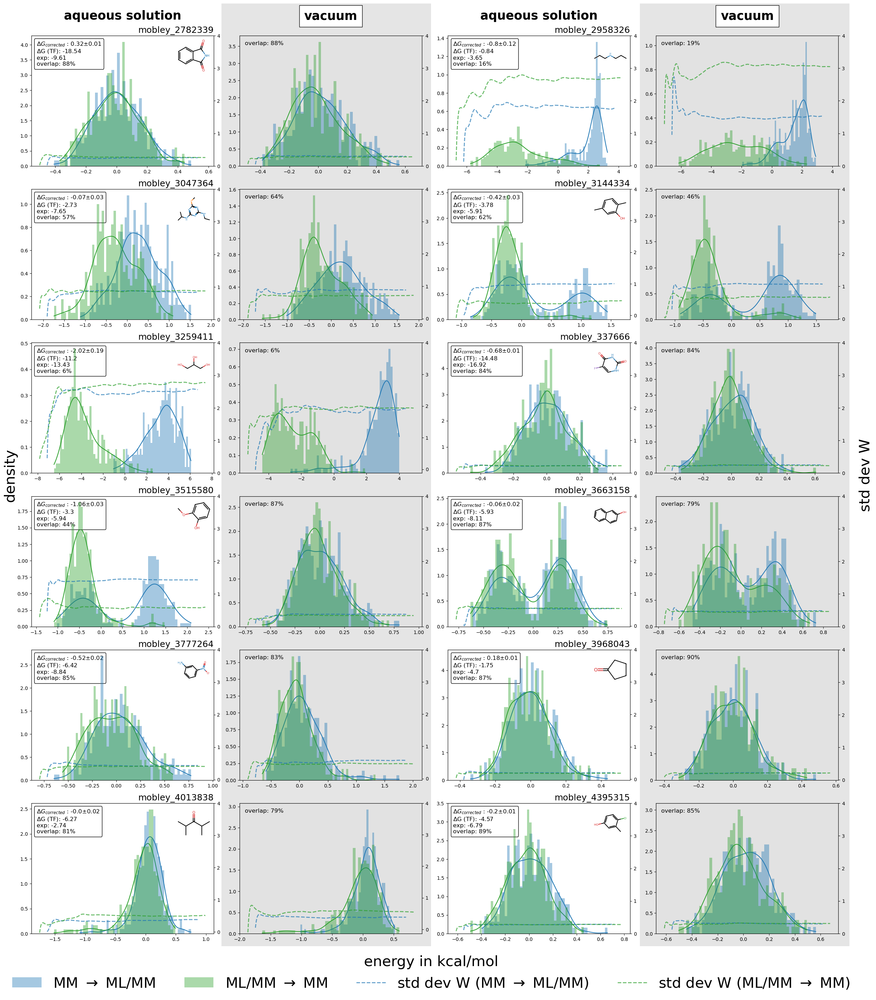

/tmp/ipykernel_65251/1743128015.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


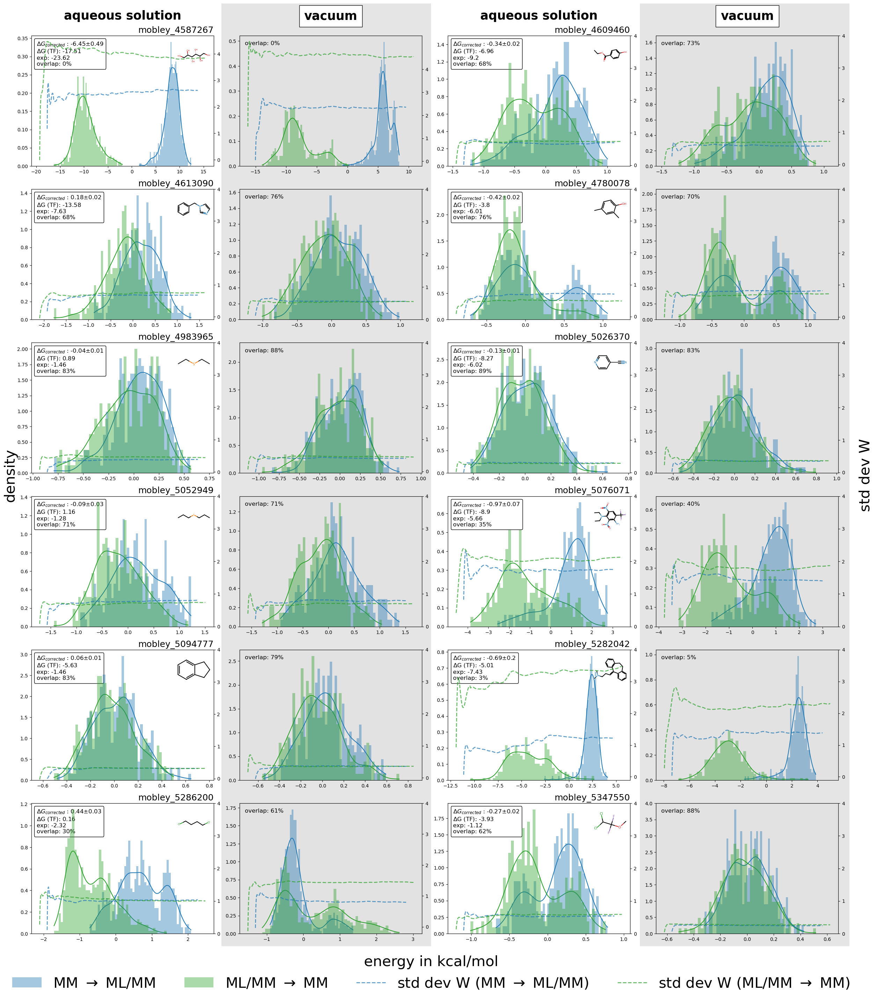

/tmp/ipykernel_65251/1743128015.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


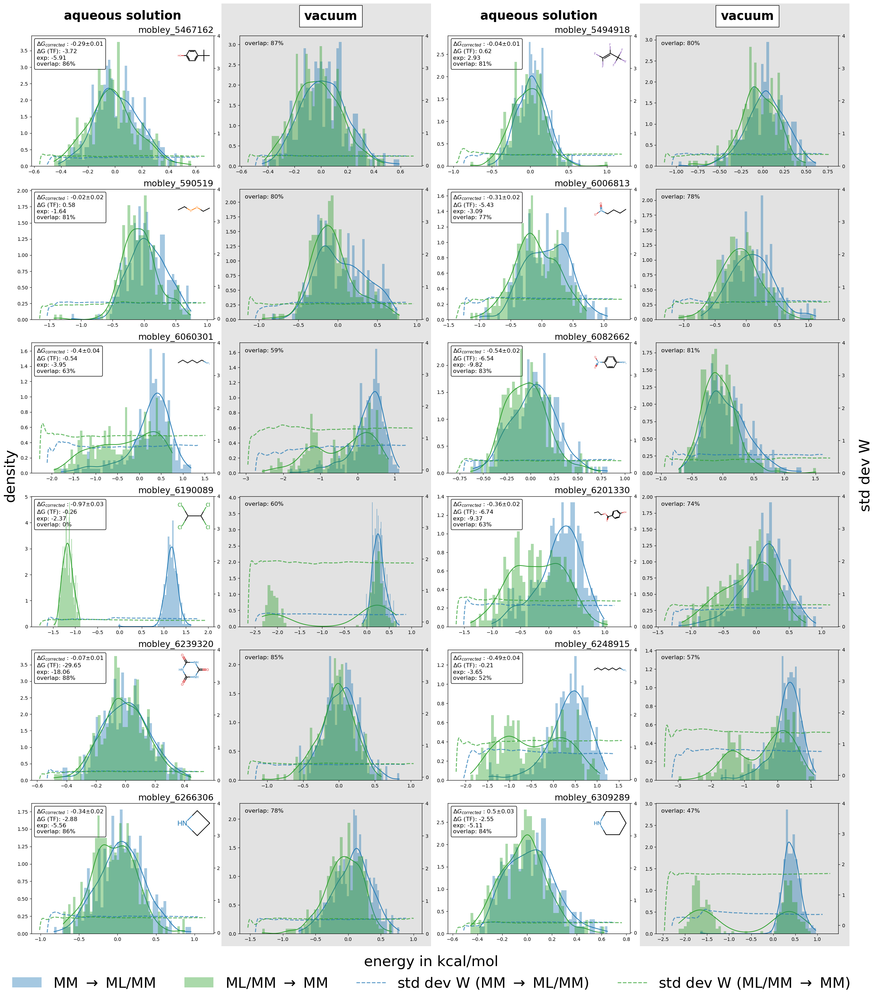

/tmp/ipykernel_65251/1743128015.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


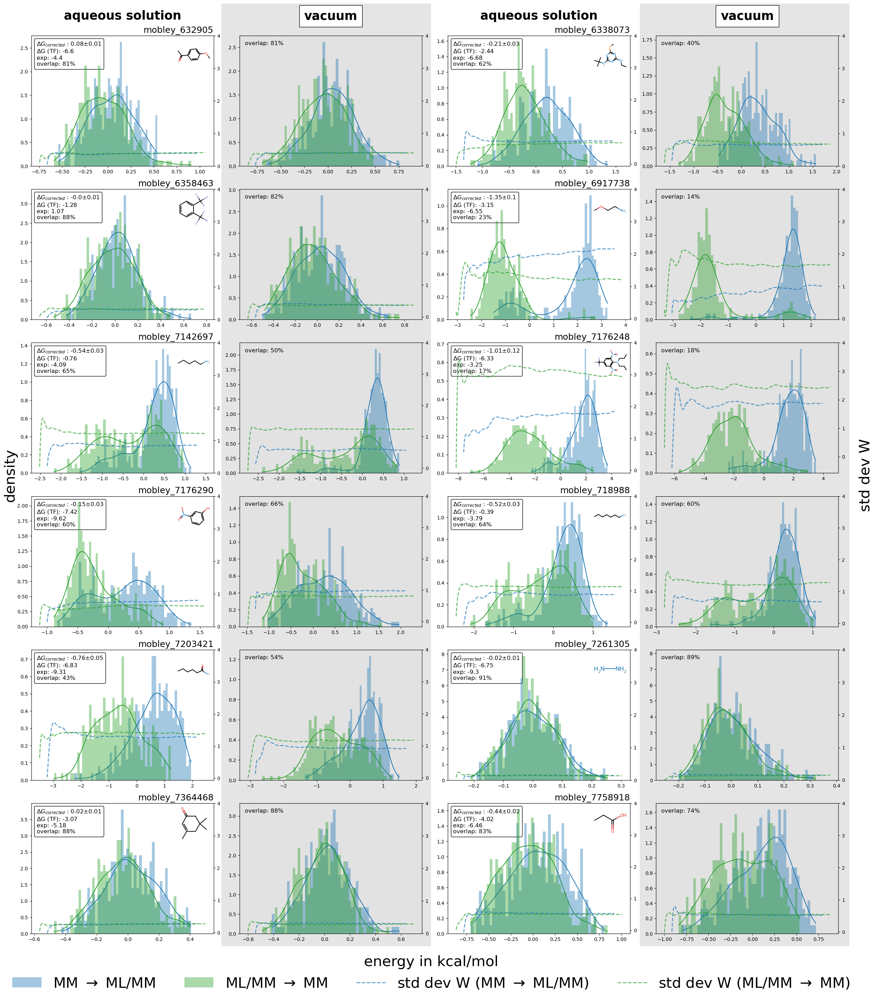

/tmp/ipykernel_65251/1743128015.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


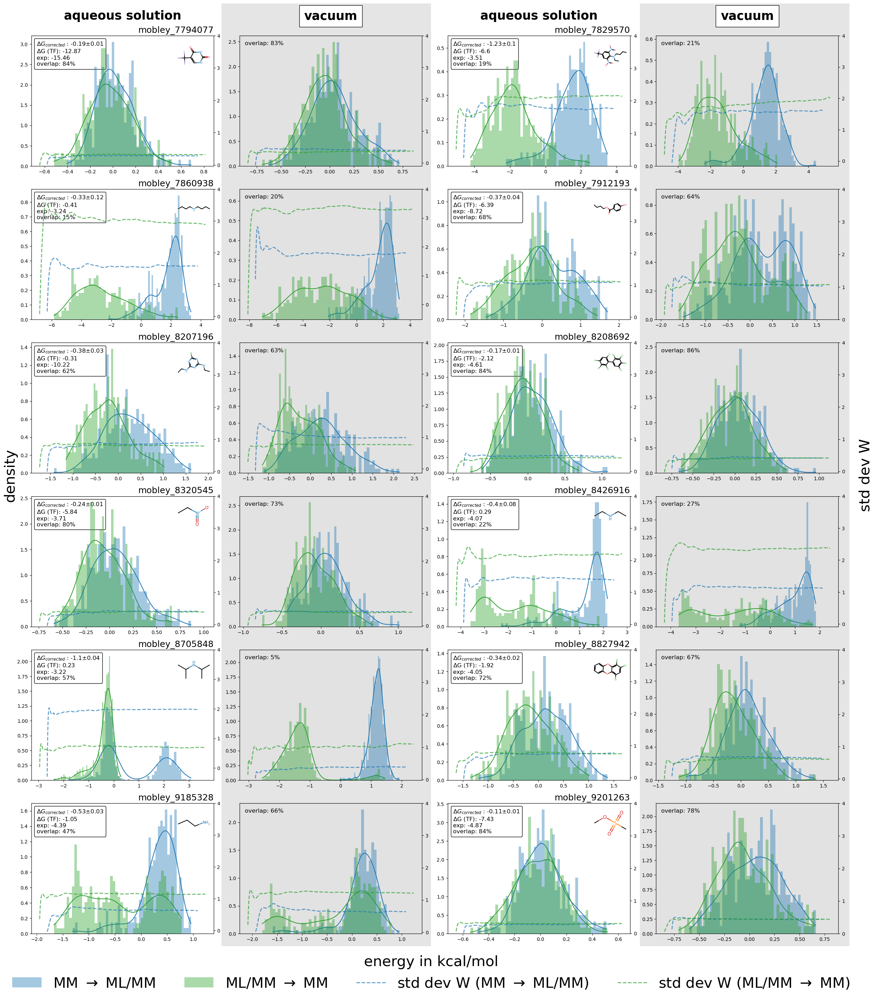

/tmp/ipykernel_65251/1743128015.py:105: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


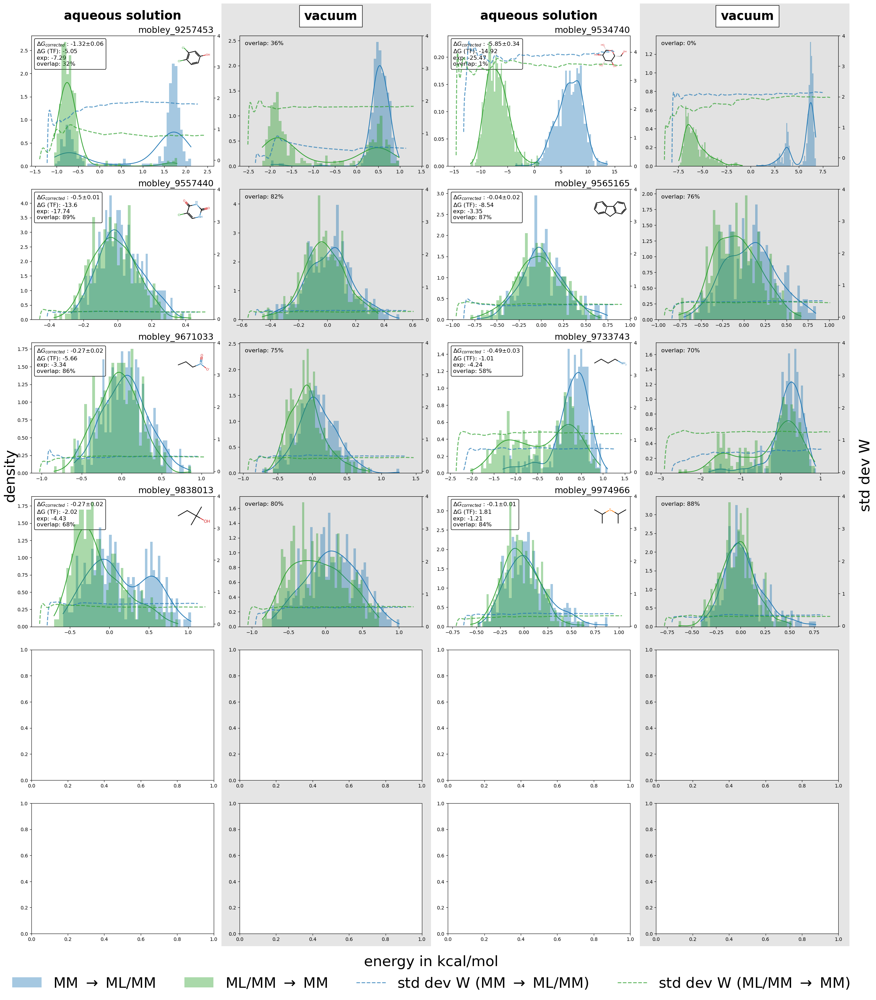

In [14]:
sns.reset_orig

fig, axs = plt.subplots(
    6, 4, figsize=(24, 27), sharey=False, sharex=False
)  # ,sharey=True, sharex=True
fig.subplots_adjust(hspace=0.15, wspace=0.1)
axs = axs.ravel()

env = "waterbox"

i = 0
plotNR = 1
corrected = dict()
for name in sorted(files):
    # for name in wrongDirection:
    for index, row in data.iterrows():
        if name == row["# compound id (and file prefix)"]:
            smi = row[" SMILES"].strip()
            dG = row["dG (TF)"]
            experiment = row[" experimental value (kcal/mol)"]

            with open(f"output/{name}.pickle", "rb") as file:
                results = pickle.load(file)
                correction, error, mlCorrected, _, _ = calculate_corrections(
                    results, dG
                )

            data.loc[index, "dG (corrected)"] = round(mlCorrected, 2)
            data.loc[index, "Ml correction"] = round(correction, 2)
            data.loc[index, "error"] = round(error, 2)

            if i % 22 == 0 and i != 0:
                plot_one_subplot(
                    name, results, env, corrected, i, dG, experiment, correction, error
                )
                i += 1
                plot_one_subplot(
                    name,
                    results,
                    "vacuum",
                    corrected,
                    i,
                    dG,
                    experiment,
                    correction,
                    error,
                )

                # Things for the figure and saving process
                add_headerText()
                r1, r2 = create_artist(fig)
                fig.add_artist(r1)
                fig.add_artist(r2)
                plt.tight_layout()
                lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
                lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
                fig.legend(
                    [lines[0], lines[1], lines[-2], lines[-1]],
                    [labels[0], labels[1], labels[-2], labels[-1]],
                    loc="lower center",
                    ncol=4,
                    frameon=False,
                    bbox_to_anchor=(0.5, -0.06),
                    fontsize=30,
                )
                fig.text(0.5, -0.02, "energy in kcal/mol", ha="center", fontsize=30)
                fig.text(-0.01, 0.5, s="density", va="center", rotation="vertical", fontsize=30)
                fig.text(1.01, 0.5, s="std dev W", va="center", rotation="vertical", fontsize=30)
                plt.savefig(f"mlCorrection_{plotNR}.pdf", bbox_inches="tight")
                plt.show()
                plt.close()
                
                fig, axs = plt.subplots(
                    6, 4, figsize=(24, 27), sharey=False, sharex=False
                )  # ,sharey=True, sharex=True
                fig.subplots_adjust(hspace=0.15, wspace=0.1)
                axs = axs.ravel()
                plotNR += 1
                i = 0
            else:
                plot_one_subplot(
                    name, results, env, corrected, i, dG, experiment, correction, error
                )
                i += 1

                plot_one_subplot(
                    name,
                    results,
                    "vacuum",
                    corrected,
                    i,
                    dG,
                    experiment,
                    correction,
                    error,
                )
                i += 1


# Things for the figure and saving process
add_headerText()
r1, r2 = create_artist(fig)
fig.add_artist(r1)
fig.add_artist(r2)
plt.tight_layout()
lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(
    [lines[0], lines[1], lines[-2], lines[-1]],
    [labels[0], labels[1], labels[-2], labels[-1]],
    loc="lower center",
    ncol=4,
    frameon=False,
    bbox_to_anchor=(0.5, -0.06),
    fontsize=30,
)
fig.text(0.5, -0.02, "energy in kcal/mol", ha="center", fontsize=30)
fig.text(-0.01, 0.5, s="density", va="center", rotation="vertical", fontsize=30)
fig.text(1.01, 0.5, s="std dev W", va="center", rotation="vertical", fontsize=30)
plt.savefig(f"mlCorrection_{plotNR}.pdf", bbox_inches="tight")
plt.show()
plt.close()

In [15]:
data.loc[:, "vac overlap"] = np.nan
data.loc[:, "wat overlap"] = np.nan

for name in sorted(files):
    # for name in wrongDirection:
    for index, row in data.iterrows():
        if name == row["# compound id (and file prefix)"]:
            with open(f"output/{name}.pickle", "rb") as file:
                results = pickle.load(file)
            
            overlap_vac = calculate_overlap(results,"vacuum")
            overlap_wat = calculate_overlap(results,"waterbox")

            data.loc[index, "vac overlap"] = int(overlap_vac)
            data.loc[index, "wat overlap"] = int(overlap_wat)

In [16]:
data = data.dropna(subset=["dG (corrected)"])

In [17]:
def plotting_grey_area(i, one_plot=False):
    # shaded grey area
    if one_plot:
        x = np.linspace(-30, 20, 5)
        y = x
        axs.plot(x, y, alpha=0.9, color="C7", linestyle="dashed")
        y2 = x + 1
        axs.plot(x, y2, alpha=0.3, color="C7", linestyle="dashed")
        y3 = x - 1
        axs.plot(x, y3, alpha=0.3, color="C7", linestyle="dashed")
        axs.fill_between(x, y2, y3, alpha=0.3, color="Grey")

        x = np.linspace(-30, 20, 5)
        y = x
        axs.plot(x, y, alpha=0.9, color="C7", linestyle="dashed")
        y2 = x + 2
        axs.plot(x, y2, alpha=0.3, color="C7", linestyle="dashed")
        y3 = x - 2
        axs.plot(x, y3, alpha=0.3, color="C7", linestyle="dashed")
        axs.fill_between(x, y2, y3, alpha=0.3, color="Grey")
    else:
        x = np.linspace(-30, 20, 5)
        y = x
        axs[i].plot(x, y, alpha=0.9, color="C7", linestyle="dashed")
        y2 = x + 1
        axs[i].plot(x, y2, alpha=0.3, color="C7", linestyle="dashed")
        y3 = x - 1
        axs[i].plot(x, y3, alpha=0.3, color="C7", linestyle="dashed")
        axs[i].fill_between(x, y2, y3, alpha=0.3, color="Grey")

        x = np.linspace(-30, 20, 5)
        y = x
        axs[i].plot(x, y, alpha=0.9, color="C7", linestyle="dashed")
        y2 = x + 2
        axs[i].plot(x, y2, alpha=0.3, color="C7", linestyle="dashed")
        y3 = x - 2
        axs[i].plot(x, y3, alpha=0.3, color="C7", linestyle="dashed")
        axs[i].fill_between(x, y2, y3, alpha=0.3, color="Grey")


sns.set_theme(
    style="white",
    rc={
        "figure.figsize": (12, 12),
        "axes.unicode_minus": False,
        "axes.labelsize": 15.0,
        "font.size": 25,
        "legend.fontsize": 25,
        "lines.markersize": 10,
        "xtick.labelsize": 30,
        "ytick.labelsize": 30,
        "xtick.bottom": True,
        "xtick.direction": "in",
        "ytick.left": True,
        "ytick.direction": "in",
    },
)


def bootstrap_metric(fct, x_values, y_values, p_value=False):
    bootstrapped_metric = []
    # bootstrap metric to generate test distribution
    for _ in range(1000):
        indices = np.random.choice(
            range(0, len(x_values)), size=len(x_values), replace=True
        )
        x_selection = np.take(x_values, indices)
        y_selection = np.take(y_values, indices)
        if p_value:
            r = fct(x_selection, y_selection)[0]
        else:
            r = fct(x_selection, y_selection)
        bootstrapped_metric.append(r)

    # define 95% CI
    alpha = 5.0
    lower_p = alpha / 2.0
    # get value at or near percentile (take a look at the definition of percentile if
    # you have less than 100 values to make sure you understand what is happening)
    lower = np.percentile(bootstrapped_metric, lower_p)
    upper_p = (100 - alpha) + (alpha / 2.0)
    upper = np.percentile(bootstrapped_metric, upper_p)
    # calculate true mean
    if p_value:
        mean = fct(x_values, y_values)[0]
    else:
        mean = fct(x_values, y_values)
    return mean, lower, upper


def calculate_statistics(x_values, y_values):
    # bootstrap RMSE
    def calc_rmse(x_values, y_values):
        return np.sqrt(mean_squared_error(x_values, y_values))

    rmse_mean, rmse_lower, rmse_upper = bootstrap_metric(calc_rmse, x_values, y_values)
    print(
        f"RMSE:  {round(rmse_mean, 2)} [{round(rmse_lower,2)}, {round(rmse_upper,2)}]"
    )

    # bootstrap MAE
    mae_mean, mae_lower, mae_upper = bootstrap_metric(
        mean_absolute_error, x_values, y_values
    )
    print(f"MAE:  {round(mae_mean, 2)} [{round(mae_lower,2)}, {round(mae_upper,2)}]")

    # bootstrap Pearson
    pearson_mean, pearson_lower, pearson_upper = bootstrap_metric(
        scipy.stats.pearsonr, x_values, y_values, p_value=True
    )
    print(
        f"Pearson correlation:  {round(pearson_mean, 2)} [{round(pearson_lower,2)}, {round(pearson_upper,2)}]"
    )

    # bootstrap Spearman
    spearman_mean, spearman_lower, spearman_upper = bootstrap_metric(
        scipy.stats.spearmanr, x_values, y_values, p_value=True
    )
    print(
        f"Spearman's correlation:  {round(spearman_mean, 2)} [{round(spearman_lower,2)}, {round(spearman_upper,2)}]"
    )

    # bootstrap Kendalltau
    kendall_mean, kendall_lower, kendall_upper = bootstrap_metric(
        scipy.stats.kendalltau, x_values, y_values, p_value=True
    )
    print(
        f"Kendalltau: {round(kendall_mean, 2)} [{round(kendall_lower,2)}, {round(kendall_upper,2)}]"
    )

    return (
        round(rmse_mean, 2),
        round(mae_mean, 2),
        round(pearson_mean, 2),
        round(spearman_mean, 2),
        round(kendall_mean, 2),
    )

In [18]:
print(f"Uncorrected")
calculate_statistics(data[" experimental value (kcal/mol)"], data["dG (TF)"])
print(f"Corrected")
calculate_statistics(data[" experimental value (kcal/mol)"], data["dG (corrected)"])

Uncorrected
RMSE:  3.99 [3.36, 4.66]
MAE:  3.47 [3.09, 3.88]
Pearson correlation:  0.72 [0.61, 0.81]
Spearman's correlation:  0.64 [0.48, 0.77]
Kendalltau: 0.52 [0.39, 0.64]
Corrected
RMSE:  3.7 [3.13, 4.33]
MAE:  3.13 [2.74, 3.58]
Pearson correlation:  0.77 [0.65, 0.86]
Spearman's correlation:  0.63 [0.46, 0.77]
Kendalltau: 0.51 [0.37, 0.63]


(3.7, 3.13, 0.77, 0.63, 0.51)

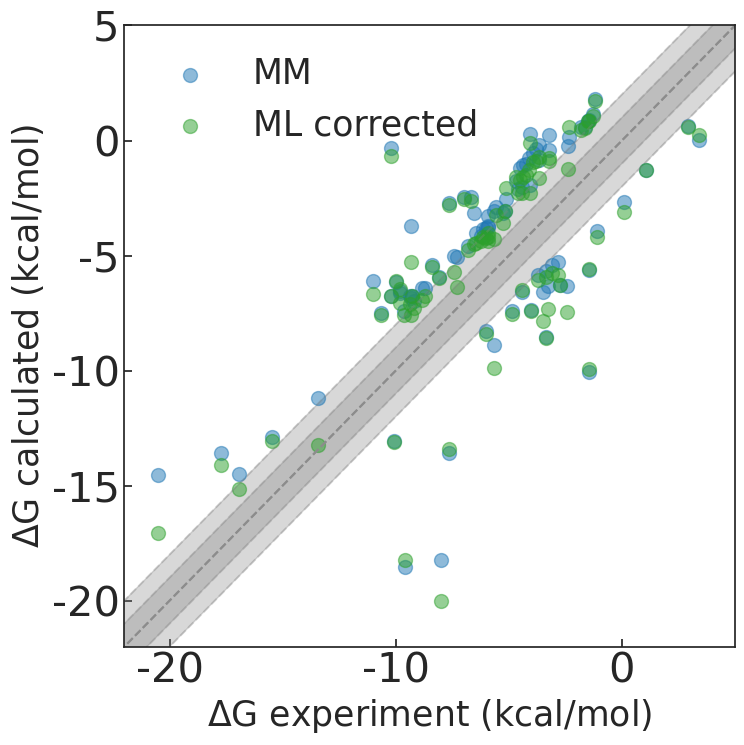

In [19]:
fig, axs = plt.subplots(1, 1, figsize=(8, 8))

plotting_grey_area(0, one_plot=True)
axs.scatter(
    data[" experimental value (kcal/mol)"],
    data["dG (TF)"],
    alpha=0.5,
    color=c1,
    label="MM",
)
axs.scatter(
    data[" experimental value (kcal/mol)"],
    data["dG (corrected)"],
    color=c3,
    label="ML corrected",
    alpha=0.5,
)

axs.set_xlim([-22, 5])
axs.set_ylim([-22, 5])

plt.ylabel(r"$\Delta$G calculated (kcal/mol)")
plt.xlabel(r"$\Delta$G experiment (kcal/mol)")
plt.legend(frameon=False)

plt.tight_layout()
plt.savefig(
    "/site/raid2/johannes/ucloud/ml_paper/mlCorrection/images/mm_ml_corrected.pdf"
)

[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If 

[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If 

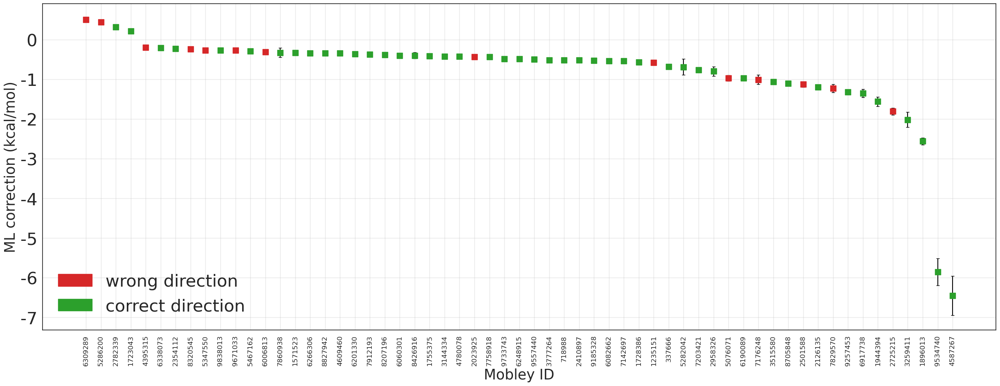

In [20]:
import matplotlib.patches as mpatches

data = data.sort_values(by="Ml correction", ascending=False)

sns.set_theme(
    style="white",
    rc={
        "font.size": 25,
        "legend.fontsize": 30,
        "lines.markersize": 10,
        "xtick.labelsize": 12,
        "ytick.labelsize": 30,
    },
)

wrongDirection = []
plt.rcParams["figure.figsize"] = (25, 10)
for index, row in data.iterrows():
    if not np.isnan(data[" experimental value (kcal/mol)"][index]):
        noCorrection = np.abs(
            data[" experimental value (kcal/mol)"][index] - data["dG (TF)"][index]
        )
        corrected = np.abs(
            data[" experimental value (kcal/mol)"][index]
            - data["dG (corrected)"][index]
        )

        if noCorrection > corrected and np.abs(data["Ml correction"][index]) > 0.2:
            plt.errorbar(
                x=data["# compound id (and file prefix)"][index].split("_")[-1],
                y=data["Ml correction"][index],
                yerr=data["error"][index],
                color=c3,
                marker="s",
                ecolor="black",
                capsize=3,
            )
        elif np.abs(data["Ml correction"][index]) < 0.2:
            pass

        else:
            plt.errorbar(
                x=data["# compound id (and file prefix)"][index].split("_")[-1],
                y=data["Ml correction"][index],
                yerr=data["error"][index],
                color=c4,
                marker="s",
                ecolor="black",
                capsize=3,
            )
            wrongDirection.append(
                f"mobley_{data['# compound id (and file prefix)'][index].split('_')[-1]}"
            )

plt.ylabel("ML correction (kcal/mol)")
plt.xlabel("Mobley ID")
red_patch = mpatches.Patch(color=c4, label="wrong direction")
green_patch = mpatches.Patch(color=c3, label="correct direction")
plt.legend(handles=[red_patch, green_patch], frameon=False, loc="lower left")
plt.grid(alpha=0.5)
plt.xticks(rotation=90)


plt.tight_layout()
plt.savefig(
    "/site/raid2/johannes/ucloud/ml_paper/mlCorrection/images/ml_correction.pdf"
)

In [21]:
len(wrongDirection)

14

In [22]:
len(data[" experimental value (kcal/mol)"])

92

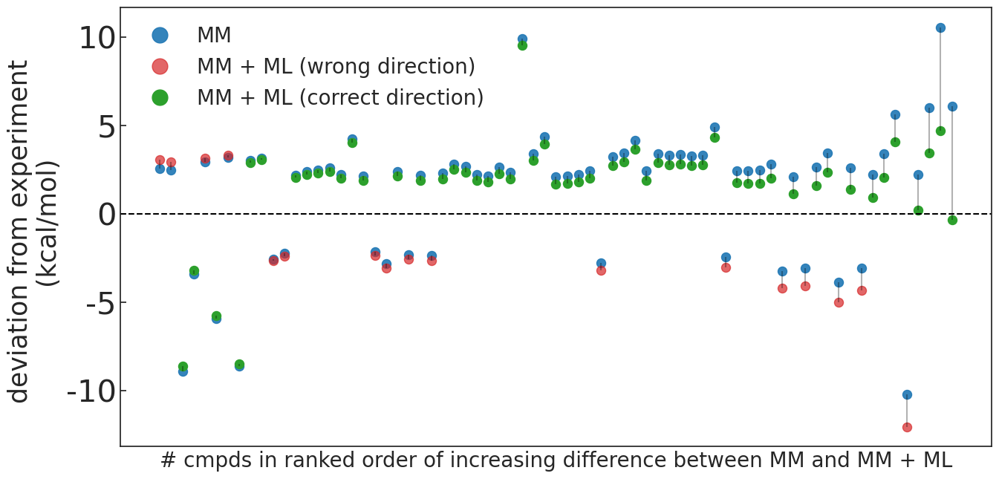

In [23]:
sns.set_theme(
    style="white",
    rc={
        "font.size": 25,
        "legend.fontsize": 20,
        "lines.markersize": 10,
        "xtick.labelsize": 12,
        "ytick.left": True,
        "ytick.direction": "in",
        "ytick.labelsize": 30,
    },
)

plt.rcParams["figure.figsize"] = (14, 7)

data = data.sort_values(by="Ml correction", ascending=False)

for index, row in data.iterrows():
    if not np.isnan(data[" experimental value (kcal/mol)"][index]):
        noCorrection = np.abs(
            data[" experimental value (kcal/mol)"][index] - data["dG (TF)"][index]
        )
        corrected = np.abs(
            data[" experimental value (kcal/mol)"][index]
            - data["dG (corrected)"][index]
        )
        if np.abs(data["Ml correction"][index]) > 0.1:
            plt.scatter(
                data["# compound id (and file prefix)"][index],
                (
                    (data[" experimental value (kcal/mol)"][index] * -1)
                    + data["dG (TF)"][index]
                ),
                s=75,
                # fmt="o",
                # capsize=3,
                # yerr=data["std (TF)"][index],
                color=c1,
                alpha=0.9,
            )

            if noCorrection >= corrected:
                plt.scatter(
                    data["# compound id (and file prefix)"][index],
                    (
                        (data[" experimental value (kcal/mol)"][index] * -1)
                        + data["dG (corrected)"][index]
                    ),
                    s=75,
                    color=c3,
                )
            else:
                plt.scatter(
                    data["# compound id (and file prefix)"][index],
                    (
                        (data[" experimental value (kcal/mol)"][index] * -1)
                        + data["dG (corrected)"][index]
                    ),
                    s=75,
                    color=c4,
                    alpha=0.7,
                )

            plt.vlines(
                x=data["# compound id (and file prefix)"][index],
                ymin=(
                    (data[" experimental value (kcal/mol)"][index] * -1)
                    + data["dG (TF)"][index]
                ),
                ymax=(
                    (data[" experimental value (kcal/mol)"][index] * -1)
                    + data["dG (corrected)"][index]
                ),
                colors="black",
                alpha=0.3,
            )


blue_patch = matplotlib.lines.Line2D(
    [0], [0], marker="o", color=c1, label="MM", ls="None", alpha=0.9, ms=15
)
red_patch = matplotlib.lines.Line2D(
    [0],
    [0],
    marker="o",
    color=c4,
    label="MM + ML (wrong direction)",
    alpha=0.7,
    ls="None",
    ms=15,
)
green_patch = matplotlib.lines.Line2D(
    [0],
    [0],
    marker="o",
    color=c3,
    label="MM + ML (correct direction)",
    ls="None",
    ms=15,
)

plt.legend(
    handles=[blue_patch, red_patch, green_patch], frameon=False, loc="upper left"
)


plt.axhline(y=0, linestyle="--", color="black")
# plt.axhline(y=-2, linestyle="--", color="black")
# plt.axhline(y=2, linestyle="--", color="black")
plt.xlabel(
    "# cmpds in ranked order of increasing difference between MM and MM + ML",
    fontsize=20,
)
plt.ylabel("deviation from experiment \n (kcal/mol)")
plt.xticks([])
plt.tight_layout()
# plt.savefig("overview.pdf", bbox_inches="tight")

In [24]:
len(wrongDirection)

14

In [25]:
data.loc[:, "numRotBonds"] = np.nan
numRotBonds = {}
for index, row in data.iterrows():
    smi = row[" SMILES"].strip()
    correction = row["Ml correction"]
    mol = Chem.MolFromSmiles(smi)
    # display(mol)
    rotBonds = Chem.rdMolDescriptors.CalcNumRotatableBonds(mol)
    data.loc[index, "numRotBonds"] = rotBonds
    # print(rotBonds)
    try:
        numRotBonds[rotBonds].append(correction)

    except KeyError:
        numRotBonds[rotBonds] = []
        numRotBonds[rotBonds].append(correction)

Text(0, 0.5, 'ML correction')

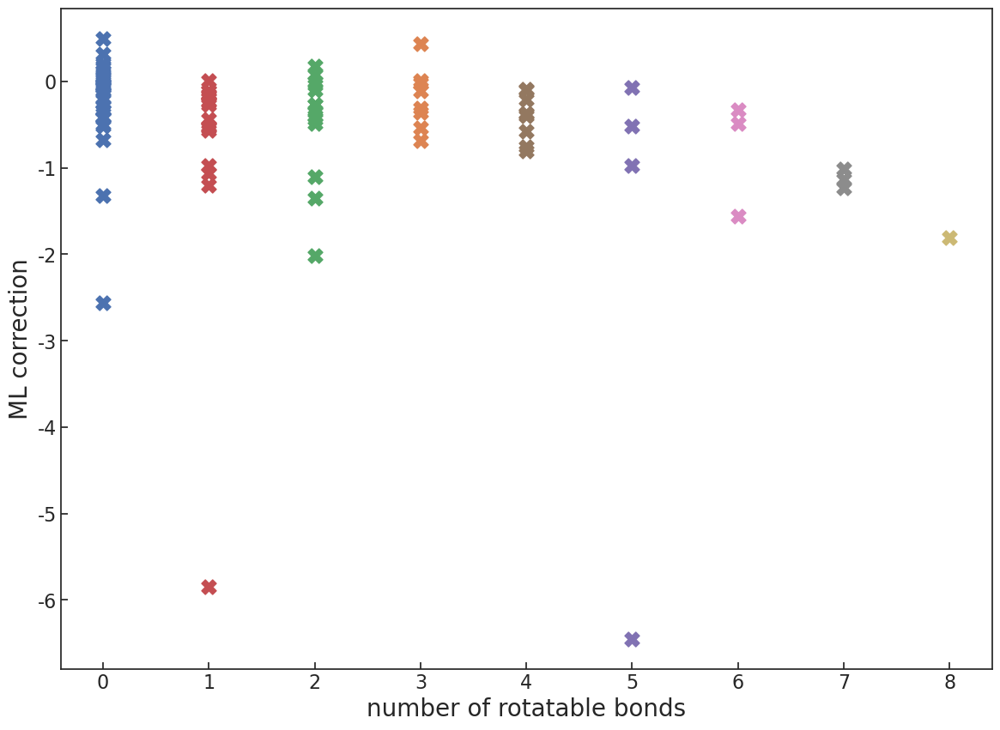

In [26]:
fig, ax1 = plt.subplots(figsize=(14, 10))

# change size of tick labels

ax1.tick_params(axis="x", bottom=True, direction="in", labelsize=16)
ax1.tick_params(axis="y", left=True, direction="in", labelsize=16)

# set the y-axis labeltick.label.set_fontsize(16)


for key, values in numRotBonds.items():
    ax1.scatter([key] * len(values), values, marker="X", label=str(key), s=150)

plt.xlabel("number of rotatable bonds", fontsize=20)
plt.ylabel("ML correction", fontsize=20)

# plt.ylim([-3,0])
# plt.savefig("numRotBonds.pdf")

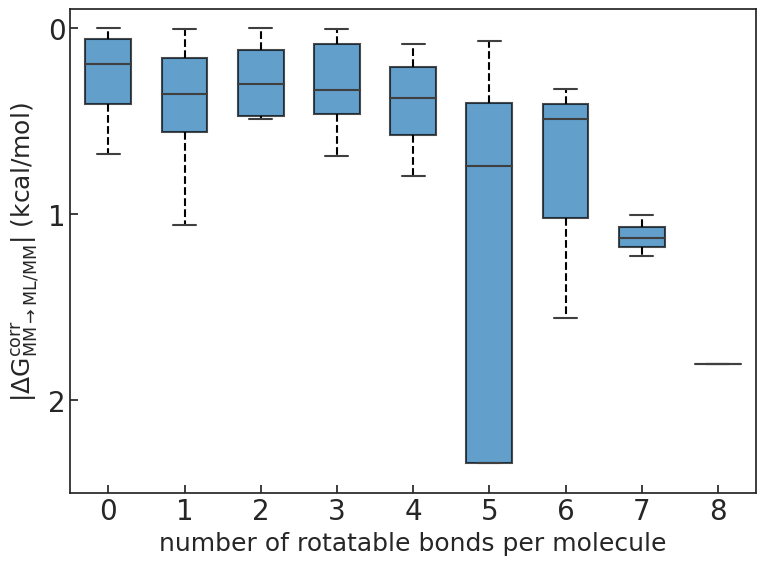

In [47]:
sns.reset_orig
sns.set_theme(
    style="white",
    rc={
        "font.size": 18,
        "legend.fontsize": 10,
        "lines.markersize": 10,
        "xtick.bottom": True,
        "xtick.direction": "in",
        "xtick.labelsize": 20,
        "ytick.left": True,
        "ytick.direction": "in",
        "ytick.labelsize": 20,
    },
)

fig, ax1 = plt.subplots(figsize=(8, 6))
sns.boxplot(
    # data=data,
    x=[int(i) for i in data["numRotBonds"].to_list()],
    y=np.abs(data["Ml correction"]),
    # hue="Force Field",
    ax=ax1,
    width=0.6,
    # medianprops=medianprops,
    showmeans=False,
    # meanprops=meanprops,
    # order=labeling.index,
    color=c1,
    saturation=1,
    linewidth=1.5,
    # palette={"GAFF": "C1", "CGenFF": "C0"},
    fliersize=12,
    autorange=True,
    # orient="h",
    showfliers=False,
    boxprops=dict(facecolor=c1, alpha=0.7, edgecolor="black", linewidth=1.5),
    whiskerprops=dict(linestyle="--", linewidth=1.5, color="black"),
)

ax1.yaxis.set_major_locator(MaxNLocator(integer=True))
plt.ylabel(r"$|\Delta \mathrm{G}^{\mathrm{corr}}_{\mathrm{MM}\rightarrow\mathrm{ML/MM}}|$ (kcal/mol)")
plt.xlabel("number of rotatable bonds per molecule")

plt.ylim([2.5,-0.1])
plt.tight_layout()
plt.savefig("boxplot_numRotBonds.pdf",bbox_inches='tight')

In [28]:
data.to_csv("ml_correction.csv")

In [29]:
data = data.sort_values(by="diff", ascending=False)
len(data)

92

[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[category.py:223 - update()] Using categorical units to plot a list of strings that are all parsable as floats or dates. If 

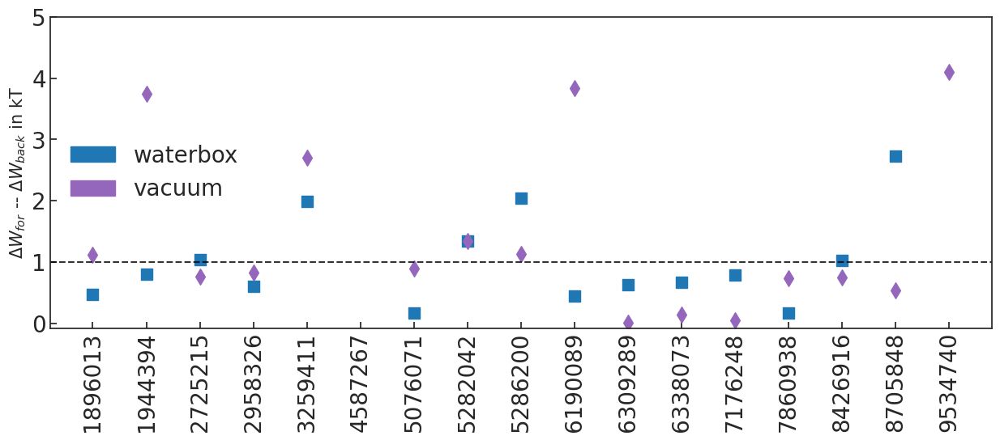

In [30]:
sns.set_theme(
    style="white",
    rc={
        "font.size": 15,
        "legend.fontsize": 20,
        "lines.markersize": 10,
        "xtick.labelsize": 20,
        "ytick.labelsize": 20,
        "xtick.bottom": True,
        "xtick.direction": "in",
        "ytick.left": True,
        "ytick.direction": "in",
    },
)

plt.rcParams["figure.figsize"] = (15, 5)

for name in sorted(files):
    for index, row in data.iterrows():
        if name == row["# compound id (and file prefix)"]:
            smi = row[" SMILES"].strip()
            dG = row["dG (TF)"]
            experiment = row[" experimental value (kcal/mol)"]

            with open(f"output/{name}.pickle", "rb") as file:
                results = pickle.load(file)
                correction, error, mlCorrected, _, _ = calculate_corrections(
                    results, dG
                )

            diff_waterbox = np.abs(
                exp(results["vacuum"].W_target_to_reference)["Delta_f"]
                + exp(results["vacuum"].W_reference_to_target)["Delta_f"]
            )
            diff_vacuum = np.abs(
                exp(results["waterbox"].W_target_to_reference)["Delta_f"]
                + exp(results["waterbox"].W_reference_to_target)["Delta_f"]
            )

            if diff_waterbox < 0.5 and diff_vacuum < 0.5:
                pass
            else:
                plt.scatter(name.split("_")[-1], diff_waterbox, marker="s", color=c1)
                plt.scatter(name.split("_")[-1], diff_vacuum, marker="d", color=c5)


red_patch = mpatches.Patch(color=c1, label="waterbox")
green_patch = mpatches.Patch(color=c5, label="vacuum")
plt.legend(handles=[red_patch, green_patch], frameon=False)
plt.xticks(rotation=90)
plt.ylabel(r"$\Delta W_{for}$ -- $\Delta W_{back}$ in kT")
plt.axhline(1, linestyle="--", color="black", alpha=0.8)
plt.ylim([-0.08, 5])
plt.show()

In [31]:
import MDAnalysis as mda
from MDAnalysis.analysis.rdf import InterRDF
from MDAnalysis.analysis import rms

In [32]:
u_mm = mda.Universe(
    f"../free_solv_round1/mobley_4587267-asfe/mobley_4587267/intst1/lig_in_waterbox.psf",
    "../free_solv_round1/mobley_4587267-asfe/mobley_4587267/intst1/run_1/lig_in_waterbox.dcd",
)
u_ml = mda.Universe(
    f"../free_solv_round1/mobley_4587267-asfe/mobley_4587267/intst1/lig_in_waterbox.psf",
    "../free_solv_round1/mobley_4587267-asfe/endstate_correction/ml_traj_waterbox.dcd",
)

[PSFParser.py:289 - _parseatoms()] Guessing that this is actually a NAMD-type PSF file... continuing with fingers crossed!
/scratch/data/johannes/miniconda3/envs/openmmml-nnpops/lib/python3.10/site-packages/MDAnalysis/coordinates/DCD.py:165: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"
[PSFParser.py:289 - _parseatoms()] Guessing that this is actually a NAMD-type PSF file... continuing with fingers crossed!


[base.py:421 - run()] Choosing frames to analyze
[base.py:428 - run()] Starting preparation
[base.py:430 - run()] Starting analysis loop over 2000 trajectory frames
[base.py:440 - run()] Finishing up
[base.py:421 - run()] Choosing frames to analyze
[base.py:428 - run()] Starting preparation
[base.py:430 - run()] Starting analysis loop over 1000 trajectory frames
[base.py:440 - run()] Finishing up


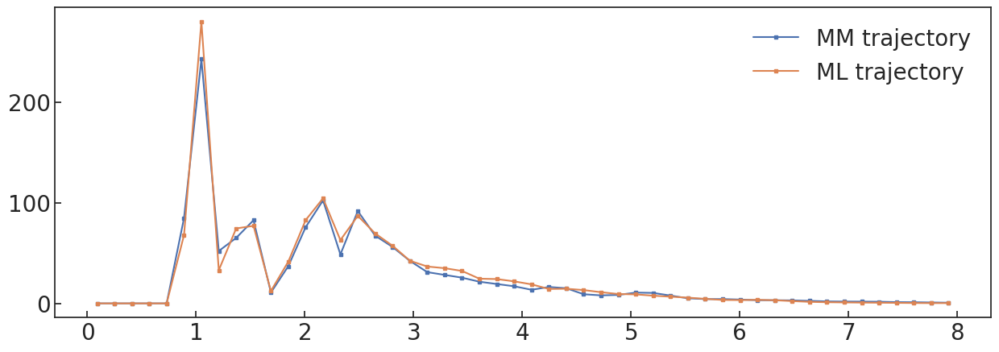

In [33]:
g1 = u_mm.select_atoms("resname UNL")
g2 = u_ml.select_atoms("resname UNL")
mm_rdf = InterRDF(g1, g1, range=(0.01, 8), nbins=50)
mm_rdf = mm_rdf.run(step=10)
ml_rdf = InterRDF(g2, g2, range=(0.01, 8), nbins=50)
ml_rdf = ml_rdf.run(step=10)

plt.plot(
    mm_rdf.results.bins,
    mm_rdf.results.rdf,
    linestyle="-",
    marker="s",
    ms=3,
    label="MM trajectory",
)
plt.plot(
    ml_rdf.results.bins,
    ml_rdf.results.rdf,
    linestyle="-",
    marker="s",
    ms=3,
    label="ML trajectory",
)
plt.legend(frameon=False)

[PSFParser.py:289 - _parseatoms()] Guessing that this is actually a NAMD-type PSF file... continuing with fingers crossed!
[PSFParser.py:289 - _parseatoms()] Guessing that this is actually a NAMD-type PSF file... continuing with fingers crossed!
[rms.py:524 - __init__()] RMS calculation for 26 atoms.
[base.py:421 - run()] Choosing frames to analyze
[base.py:428 - run()] Starting preparation
[base.py:430 - run()] Starting analysis loop over 20000 trajectory frames
[base.py:440 - run()] Finishing up
/scratch/data/johannes/miniconda3/envs/openmmml-nnpops/lib/python3.10/site-packages/MDAnalysis/analysis/rms.py:718: DeprecationWarning: The `rmsd` attribute was deprecated in MDAnalysis 2.0.0 and will be removed in MDAnalysis 3.0.0. Please use `results.rmsd` instead.
  warnings.warn(wmsg, DeprecationWarning)
[rms.py:524 - __init__()] RMS calculation for 26 atoms.
[base.py:421 - run()] Choosing frames to analyze
[base.py:428 - run()] Starting preparation
[base.py:430 - run()] Starting analysis

Text(0.5, 1.0, 'mobley_9534740')

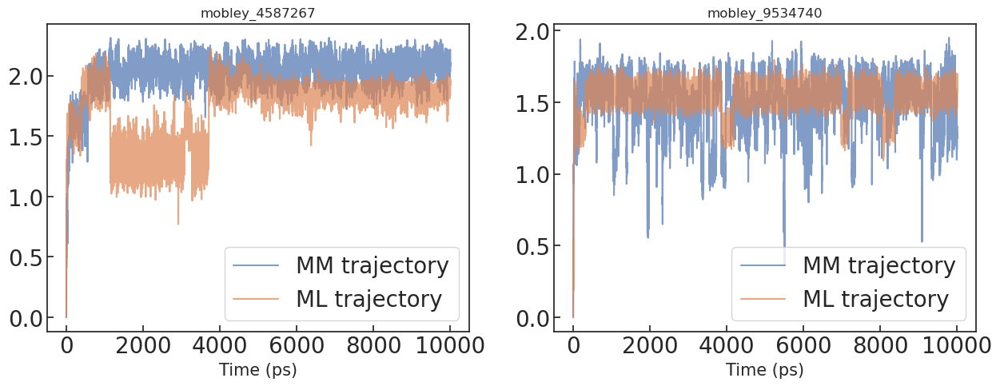

In [34]:
figure, axes = plt.subplots(1, 2, figsize=(15, 5))


def plot_rmsd(u_mm, u_ml, i):
    rmsd_mm = rms.RMSD(u_mm, select="resname UNL")
    rmsd_mm.run(step=1)
    rmsd_df_mm = pd.DataFrame(
        rmsd_mm.rmsd[:, 2:],
        columns=["unl"],
        index=rmsd_mm.rmsd[:, 1],
    )
    rmsd_df_mm.index.name = "Time (ps)"

    rmsd_ml = rms.RMSD(u_ml, select="resname UNL")
    rmsd_ml.run(step=1)
    rmsd_df_ml = pd.DataFrame(
        rmsd_ml.rmsd[:, 2:],
        columns=["unl"],
        index=rmsd_ml.rmsd[:, 1],
    )
    rmsd_df_ml.index.name = "Time (ps)"

    rmsd_df_mm.plot(ax=axes[i], alpha=0.7, label="MM trajectory")
    rmsd_df_ml.plot(ax=axes[i], alpha=0.7, label="ML trajectory")

    axes[i].legend(["MM trajectory", "ML trajectory"])


u_mm = mda.Universe(
    f"../free_solv_round1/mobley_4587267-asfe/mobley_4587267/intst1/lig_in_waterbox.psf",
    "../free_solv_round1/mobley_4587267-asfe/mobley_4587267/intst1/run_1/lig_in_waterbox.dcd",
)
u_ml = mda.Universe(
    f"../free_solv_round1/mobley_4587267-asfe/mobley_4587267/intst1/lig_in_waterbox.psf",
    "../free_solv_round1/mobley_4587267-asfe/endstate_correction/ml_traj_waterbox.dcd",
)

plot_rmsd(u_mm, u_ml, 0)
axes[0].set_title("mobley_4587267")
u_mm = mda.Universe(
    f"../free_solv_round2/mobley_9534740-asfe/mobley_9534740/intst1/lig_in_waterbox.psf",
    "../free_solv_round2/mobley_9534740-asfe/mobley_9534740/intst1/run_1/lig_in_waterbox.dcd",
)
u_ml = mda.Universe(
    f"../free_solv_round2/mobley_9534740-asfe/mobley_9534740/intst1/lig_in_waterbox.psf",
    "../free_solv_round2/mobley_9534740-asfe/endstate_correction/ml_traj_waterbox.dcd",
)

plot_rmsd(u_mm, u_ml, 1)
axes[1].set_title("mobley_9534740")